# Part 4c, Modelling for loop: Pros online  - DO NOT RUN ON OPEN!

In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as datetime
from sklearn.preprocessing import StandardScaler

sns.set(font_scale=1.5)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import statsmodels.api as sm  
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox
import scipy.stats as stats

# Standard plotly imports
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
from plotly import tools
import networkx as nx

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)


In [2]:
#import data
all_traffic=pd.read_csv('all_players_modelling_df.csv')
rec_traffic=pd.read_csv('recreational_players_modelling_df.csv')
pros_online=pd.read_csv('pros_online_modelling_df.csv')

In [3]:
#drop unnecessary columns and recast to date time
all_traffic=all_traffic[['date_time','game_count']]
all_traffic['date_time']=all_traffic['date_time'].apply(pd.Timestamp)
all_traffic.set_index('date_time', inplace=True)
all_traffic.columns=['all_games_count']

In [4]:
rec_traffic=rec_traffic[['date_time','game_count']]
rec_traffic['date_time']=rec_traffic['date_time'].apply(pd.Timestamp)
rec_traffic.set_index('date_time', inplace=True)
rec_traffic.columns=['rec_games_count']

In [5]:
pros_online=pros_online[['date_time','pros_online']]
pros_online['date_time']=pros_online['date_time'].apply(pd.Timestamp)
pros_online.set_index('date_time', inplace=True)

In [6]:
#Time series report function
def time_series_report (time_series, model, predictions=None):
    """"""
    
    #Info from model summary 
    report='\n\nSTATESPACE MODEL RESULTS AND DIAGNOSTICS\n'
    for i in (str(model.summary()).split('\n')[1:4]):
        report=report+i+('\n')
    report=report+('\n')
    for i in (str(model.summary()).split('\n')[10:]):
        if i[0]== '=':
            break
        else:
            report=report+i+('\n')
            
    print(report)
    
    #Rerunning models after each updated value is too computationally heavy.
    #Train models on first 80% of sample, test on last 20%
    
    #set test and train
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]
    test=time_series[len(time_series)-length_train:]
    preds = model.predict( dynamic=False)
    
    
    #Residuals and standardised residuals
    train_resid= model.resid[:len(time_series)-length_train]
    test_resid=model.resid[len(time_series)-length_train:]
    scaler=StandardScaler()
    test_stan_resid=pd.DataFrame(scaler.fit_transform(pd.DataFrame(test_resid)))
    test_stan_resid.index=test_resid.index
    test_stan_resid.columns=['resid_p']
    
    #residuals histogram
    plot_test_residuals=go.Histogram(x=test_resid)
    plot_train_residuals=go.Histogram(x=train_resid)

    #corellogram plot
    correl= pd.Series(acorr_ljungbox(model.resid, lags=10, boxpierce=True)[3])
    plot_correl=go.Bar(x=list(range(1,21)),
                       y=correl)

    #option resample standardised residuals to make clearer
    #test_stan_resid=test_stan_resid.resample('6H').mean()
    
    #standardised residuals line graph
    plot_sr=  go.Scatter(
                        x = test_stan_resid.index,
                        y = test_stan_resid.resid_p,
                        mode = 'lines',
                        name = 'Standardised residuals'
                    )

    fig = tools.make_subplots(rows=2, cols=2, print_grid=False, 
                              subplot_titles=('Train residuals distribution',
                                              'Corellogram - all residuals',
                                              'Test residuals distribution',
                                              'Standardised test residuals'
                                             ))
    
    fig.append_trace(plot_train_residuals, 1, 1)
    fig.append_trace(plot_test_residuals, 2, 1)
    fig.append_trace(plot_correl, 1, 2)
    fig.append_trace(plot_sr, 2, 2)
    fig['layout']['yaxis2'].update(title='P-value', range=[0, 1])
    fig['layout'].update(showlegend=False, title='DIAGNOSTICS')
    iplot(fig)
    
    print('QUANTILE PLOT - ALL RESIDUALS')
    fig = sm.qqplot(model.resid, stats.norm, fit=True, line='45')
    plt.show()
    return 

In [7]:
def baseline_vs_model(time_series, model):
    #uses mean of test set for all predictions
    
    #if option for resample is needed at arguement for resample in function
    #time_series=time_series.resample(resample).sum()
    
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]
    test = time_series[len(time_series)-length_train:]
    
    pred=[train.mean()]*(len(time_series)-length_train)
    
    train_mse=round(mean_squared_error(train, pred),4)
    train_mae=round(mean_absolute_error(train, pred),4)
    train_r2=round(r2_score(train, pred),4)
    
    pred=[train.mean()]*length_train
    test_mse=round(mean_squared_error(test, pred),4)
    test_mae=round(mean_absolute_error(test, pred),4)
    test_r2=round(r2_score(test, pred),4)
    data={'Base_train': [train_mse, train_mae, train_r2], 
          'Base_test': [test_mse, test_mae, test_r2 ]}
    
    #model predictions
    preds = model.predict(dynamic=False)
    
    #model test scores
    train_preds=preds[:len(time_series)-length_train]
    train_mse=round(mean_squared_error(train, train_preds),4)
    train_mae=round(mean_absolute_error(train, train_preds),4)
    train_r2=round(r2_score(train, train_preds),4)
    data['Model_train']=[train_mse, train_mae, train_r2]
    
    #model test scores
    test_preds=preds[len(time_series)-length_train:]
    test_mse=round(mean_squared_error(test, test_preds),4)
    test_mae=round(mean_absolute_error(test, test_preds),4)
    test_r2=round(r2_score(test, test_preds),4)
    data['Model_test']=[test_mse, test_mae, test_r2 ]
    
    data=pd.DataFrame(data)
    data.index=['MSE', 'MAE', 'R^2']

    
    print(data)
    return data

In [8]:
def model_test(time_series, olag, oma, solag, soma, season, freq):
    """ time_series= column used for prediction
    olag= order lag
    oma=order moving average
    solag=seasonal order lag
    soma = seasonal order moving average
    season = seasons component - should be day or week
    freq= frequency for resample, same as input for resample function"""
    time_series=time_series.resample(freq).mean()
        
    length_train=round(len(time_series)/5)
    train=time_series[:len(time_series)-length_train]

    #obtain model parameters using training set
    tmodel = sm.tsa.statespace.SARIMAX(train,
                                      order=(olag, 0, oma),
                                      seasonal_order=(solag, 0, soma, season),
                                      freq=freq)
    results = tmodel.fit(max_iter=1000)

    #use previous model parameters, add test set to sata to allow for predictions
    model = sm.tsa.statespace.SARIMAX(time_series,
                                      order=(olag, 0, oma),
                                      seasonal_order=(solag, 0, soma, season),
                                     freq=freq)
    final_model=model.filter(results.params)
    
    baseline_vs_model(time_series, final_model)
    
    time_series_report(time_series, final_model)
    
    return final_model

## For loop

In [9]:
data=pros_online.pros_online

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3818      1.5278
MAE      1.9830     1.8656       1.1844      0.9622
R^2      0.0000    -0.5708       0.6165      0.5077


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 24)   Log Likelihood              -13746.053

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7873      0.010     78.561      0.000       0.768       0.807
ma.L1         -0.2532      0.015    -16.483      0.000      -0.283      -0.223
ar.S.L24       0.9993      0.000   4286.717      0.000       0.999       1.000
ma.S.L24      -0.9650      0.003   -285.597      0.000      -0.972      -0.958
sigma2         2.3593      0.032     72.866      0.000       2.296       2.423



QUANTILE PLOT - ALL RESIDUALS


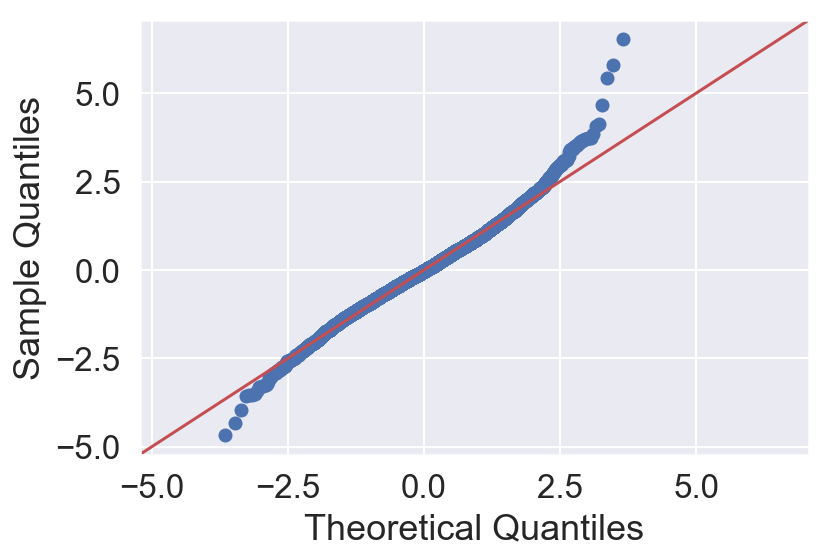

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3698      1.5231
MAE      1.9830     1.8656       1.1816      0.9615
R^2      0.0000    -0.5708       0.6184      0.5092


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(1, 0, 2, 24)   Log Likelihood              -13727.481

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7790      0.010     75.399      0.000       0.759       0.799
ma.L1         -0.2491      0.016    -15.872      0.000      -0.280      -0.218
ar.S.L24       0.9996      0.000   6587.821      0.000       0.999       1.000
ma.S.L24      -0.9004      0.011    -81.541      0.000      -0.922      -0.879
ma.S.L48      -0.0726      0.011     -6.578      0.000      -0.094      -0.051
sigma2       

QUANTILE PLOT - ALL RESIDUALS


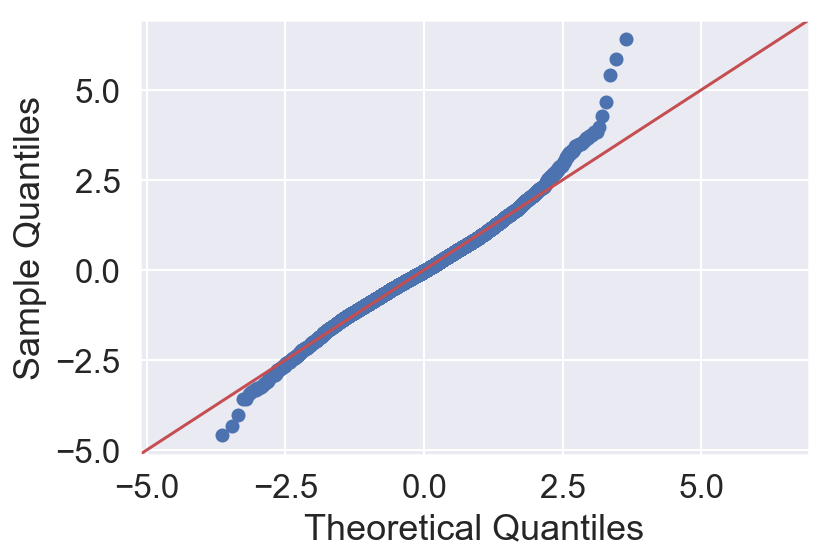

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3689      1.5229
MAE      1.9830     1.8656       1.1817      0.9615
R^2      0.0000    -0.5708       0.6185      0.5093


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(2, 0, 1, 24)   Log Likelihood              -13726.062

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7783      0.010     75.315      0.000       0.758       0.799
ma.L1         -0.2502      0.016    -15.958      0.000      -0.281      -0.219
ar.S.L24       1.0799      0.011     95.499      0.000       1.058       1.102
ar.S.L48      -0.0802      0.011     -7.103      0.000      -0.102      -0.058
ma.S.L24      -0.9756      0.003   -324.224      0.000      -0.982      -0.970
sigma2       

QUANTILE PLOT - ALL RESIDUALS


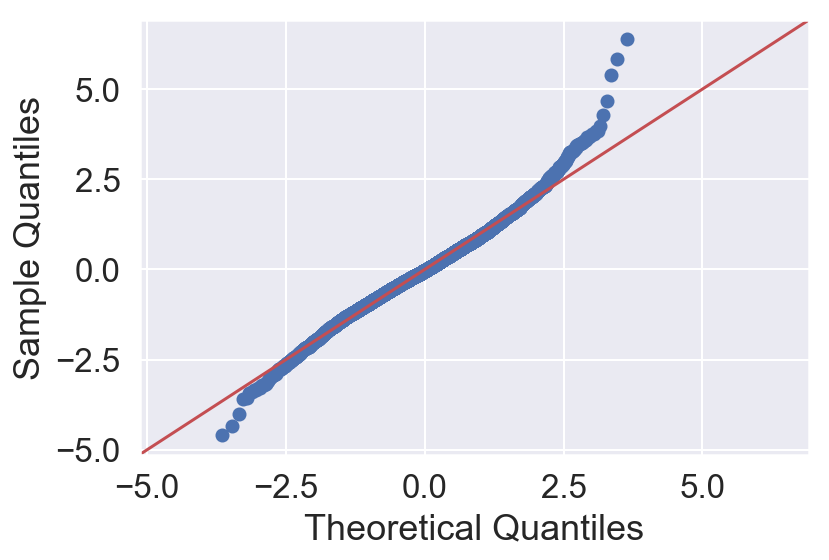

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3692      1.5200
MAE      1.9830     1.8656       1.1816      0.9603
R^2      0.0000    -0.5708       0.6185      0.5102


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 1)x(2, 0, 2, 24)   Log Likelihood              -13727.456

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7824      0.010     76.006      0.000       0.762       0.803
ma.L1         -0.2535      0.016    -16.174      0.000      -0.284      -0.223
ar.S.L24       1.0650      0.131      8.104      0.000       0.807       1.323
ar.S.L48      -0.0654      0.131     -0.498      0.618      -0.323       0.192
ma.S.L24      -0.9698      0.132     -7.351      0.000      -1.228      -0.711
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


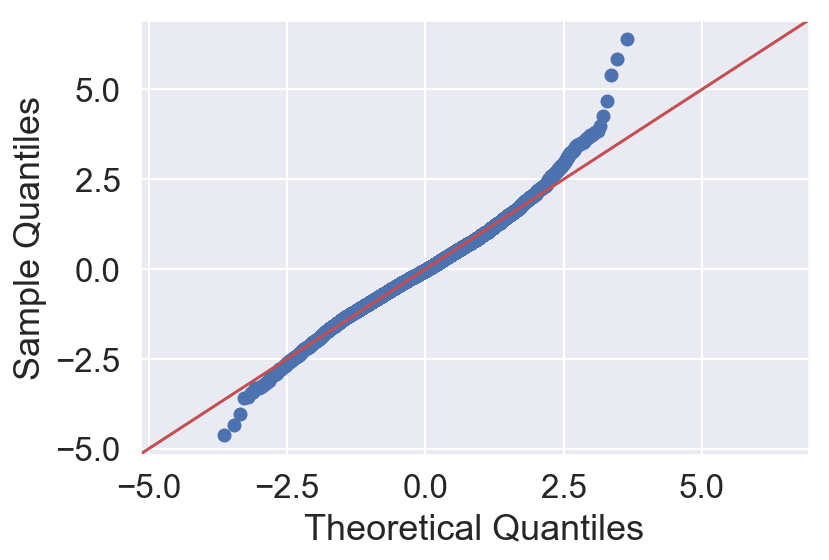

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3750      1.5252
MAE      1.9830     1.8656       1.1830      0.9623
R^2      0.0000    -0.5708       0.6176      0.5085


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(1, 0, 1, 24)   Log Likelihood              -13736.501

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8353      0.012     72.520      0.000       0.813       0.858
ma.L1         -0.2929      0.016    -18.613      0.000      -0.324      -0.262
ma.L2         -0.0763      0.014     -5.604      0.000      -0.103      -0.050
ar.S.L24       0.9992      0.000   3845.490      0.000       0.999       1.000
ma.S.L24      -0.9652      0.003   -284.864      0.000      -0.972      -0.959
sigma2       

QUANTILE PLOT - ALL RESIDUALS


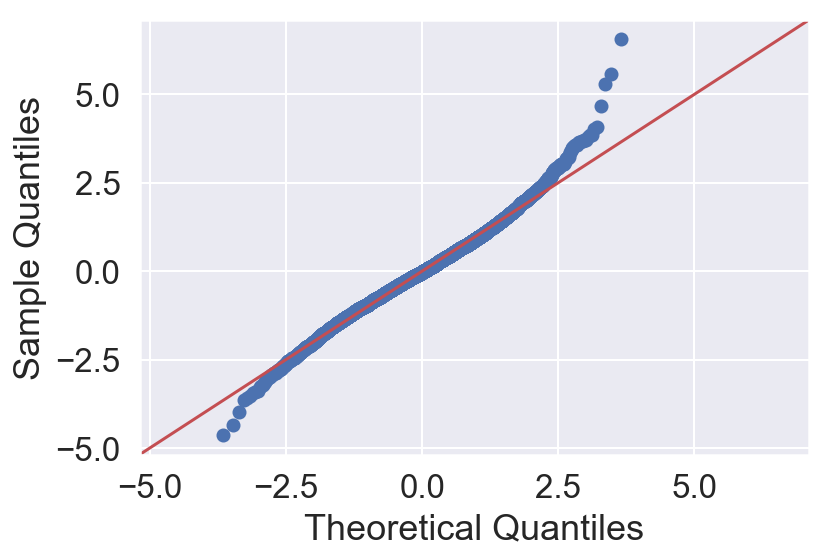

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3627      1.5173
MAE      1.9830     1.8656       1.1804      0.9595
R^2      0.0000    -0.5708       0.6195      0.5111


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(1, 0, 2, 24)   Log Likelihood              -13715.793

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8294      0.012     69.380      0.000       0.806       0.853
ma.L1         -0.2935      0.016    -18.181      0.000      -0.325      -0.262
ma.L2         -0.0758      0.014     -5.531      0.000      -0.103      -0.049
ar.S.L24       0.9995      0.000   5419.524      0.000       0.999       1.000
ma.S.L24      -0.8984      0.011    -81.482      0.000      -0.920      -0.877
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


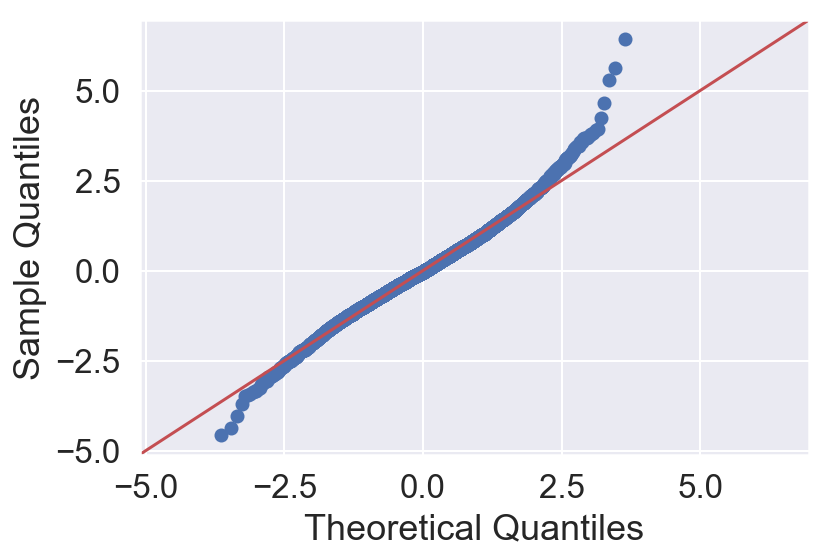

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3627      1.5119
MAE      1.9830     1.8656       1.1803      0.9571
R^2      0.0000    -0.5708       0.6195      0.5128


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(2, 0, 1, 24)   Log Likelihood              -13714.018

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8301      0.012     68.764      0.000       0.806       0.854
ma.L1         -0.2944      0.016    -18.234      0.000      -0.326      -0.263
ma.L2         -0.0763      0.014     -5.530      0.000      -0.103      -0.049
ar.S.L24       1.0753      0.011     94.294      0.000       1.053       1.098
ar.S.L48      -0.0759      0.011     -6.666      0.000      -0.098      -0.054
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


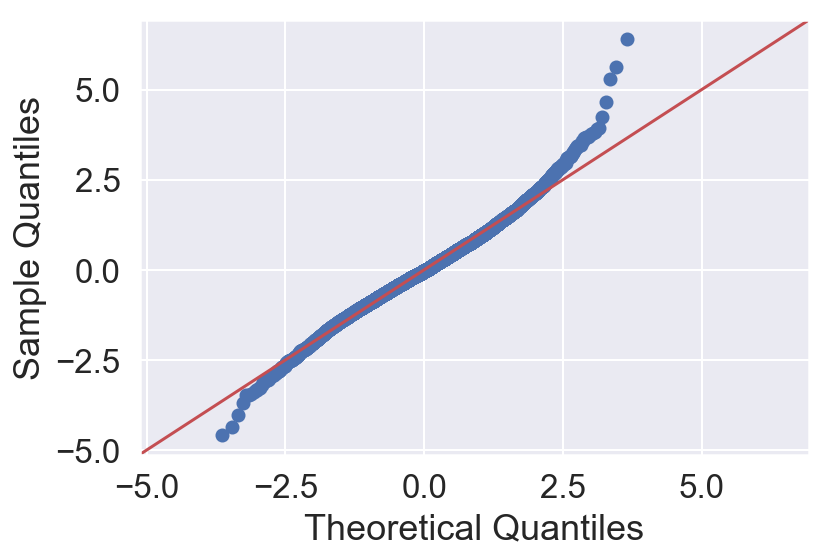

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3671      1.5204
MAE      1.9830     1.8656       1.1819      0.9607
R^2      0.0000    -0.5708       0.6188      0.5101


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(1, 0, 2)x(2, 0, 2, 24)   Log Likelihood              -13722.914

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8438      0.011     74.592      0.000       0.822       0.866
ma.L1         -0.3052      0.015    -19.699      0.000      -0.336      -0.275
ma.L2         -0.0853      0.013     -6.334      0.000      -0.112      -0.059
ar.S.L24       0.5366      0.134      3.999      0.000       0.274       0.800
ar.S.L48       0.4626      0.134      3.450      0.001       0.200       0.725
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


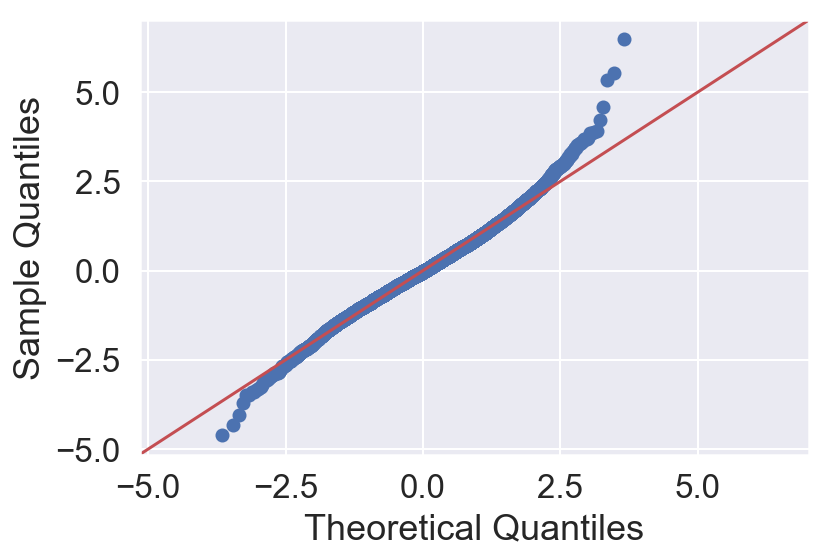

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3556      1.5198
MAE      1.9830     1.8656       1.1787      0.9567
R^2      0.0000    -0.5708       0.6207      0.5103


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(1, 0, 1, 24)   Log Likelihood              -13707.777

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5008      0.013    112.013      0.000       1.475       1.527
ar.L2         -0.5096      0.012    -42.459      0.000      -0.533      -0.486
ma.L1         -0.9306      0.009   -101.310      0.000      -0.949      -0.913
ar.S.L24       0.9983      0.001   1894.459      0.000       0.997       0.999
ma.S.L24      -0.9658      0.004   -269.037      0.000      -0.973      -0.959
sigma2       

QUANTILE PLOT - ALL RESIDUALS


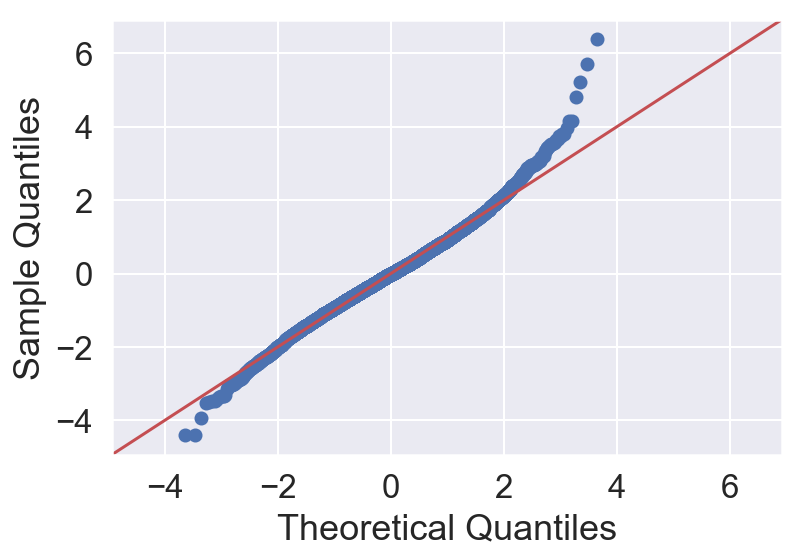

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3492      1.5083
MAE      1.9830     1.8656       1.1775      0.9522
R^2      0.0000    -0.5708       0.6217      0.5140


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(1, 0, 2, 24)   Log Likelihood              -13692.922

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4881      0.015     97.379      0.000       1.458       1.518
ar.L2         -0.4978      0.014    -36.201      0.000      -0.525      -0.471
ma.L1         -0.9234      0.010    -89.731      0.000      -0.944      -0.903
ar.S.L24       0.9982      0.001   1915.704      0.000       0.997       0.999
ma.S.L24      -0.9076      0.011    -80.569      0.000      -0.930      -0.886
ma.S.L48     

QUANTILE PLOT - ALL RESIDUALS


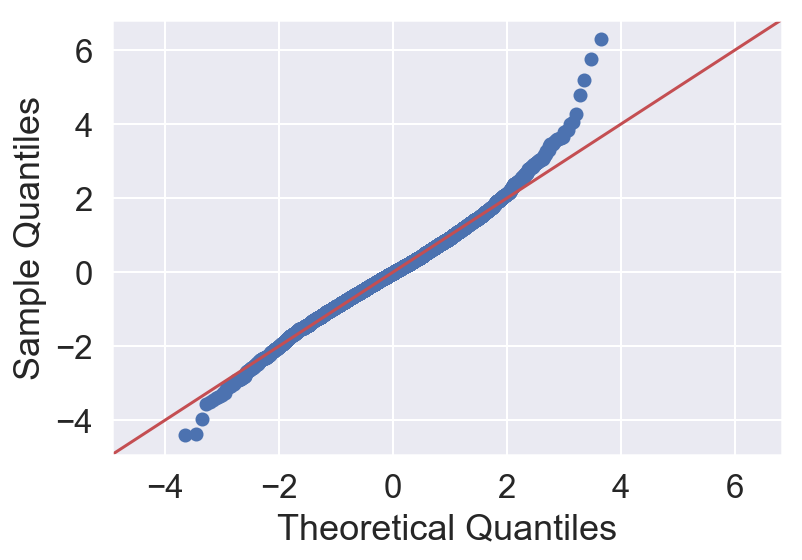

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3458      1.5078
MAE      1.9830     1.8656       1.1769      0.9519
R^2      0.0000    -0.5708       0.6223      0.5142


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 24)   Log Likelihood              -13688.828

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4952      0.014    106.292      0.000       1.468       1.523
ar.L2         -0.5041      0.013    -39.228      0.000      -0.529      -0.479
ma.L1         -0.9306      0.009   -100.687      0.000      -0.949      -0.912
ar.S.L24       1.0648      0.006    180.952      0.000       1.053       1.076
ar.S.L48      -0.0661      0.006    -11.519      0.000      -0.077      -0.055
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


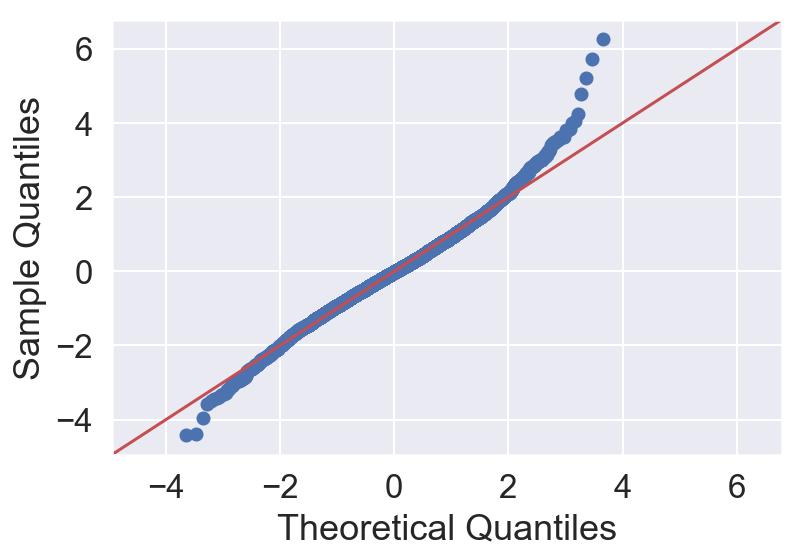

/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:508: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3525      1.5157
MAE      1.9830     1.8656       1.1776      0.9565
R^2      0.0000    -0.5708       0.6212      0.5116


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 1)x(2, 0, 2, 24)   Log Likelihood              -13701.447

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4918      0.015     98.748      0.000       1.462       1.521
ar.L2         -0.5018      0.014    -36.935      0.000      -0.528      -0.475
ma.L1         -0.9247      0.010    -89.839      0.000      -0.945      -0.905
ar.S.L24       0.1308      0.005     24.795      0.000       0.120       0.141
ar.S.L48       0.8659      0.005    159.236      0.000       0.855       0.877
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


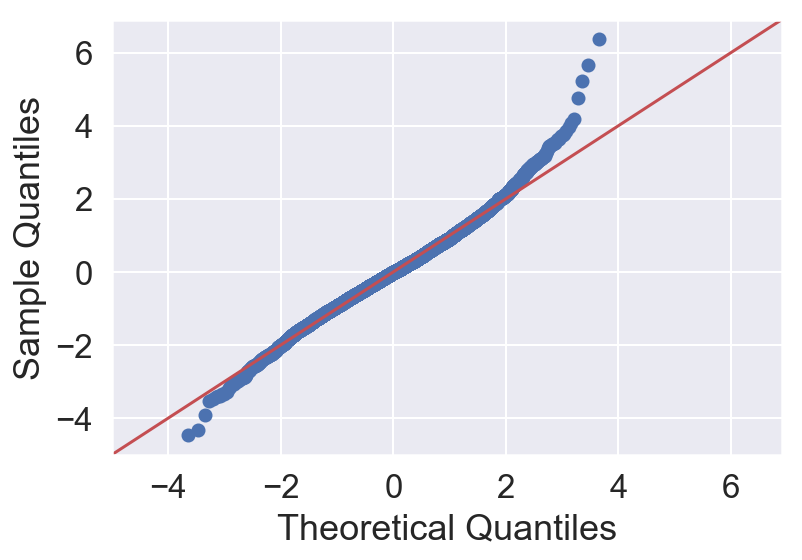

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3502      1.5084
MAE      1.9830     1.8656       1.1774      0.9543
R^2      0.0000    -0.5708       0.6215      0.5139


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(1, 0, 1, 24)   Log Likelihood              -13696.199

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5501      0.019     80.639      0.000       1.512       1.588
ar.L2         -0.5661      0.018    -32.007      0.000      -0.601      -0.531
ma.L1         -1.0165      0.022    -45.780      0.000      -1.060      -0.973
ma.L2          0.1037      0.018      5.926      0.000       0.069       0.138
ar.S.L24       0.9984      0.001   1928.288      0.000       0.997       0.999
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


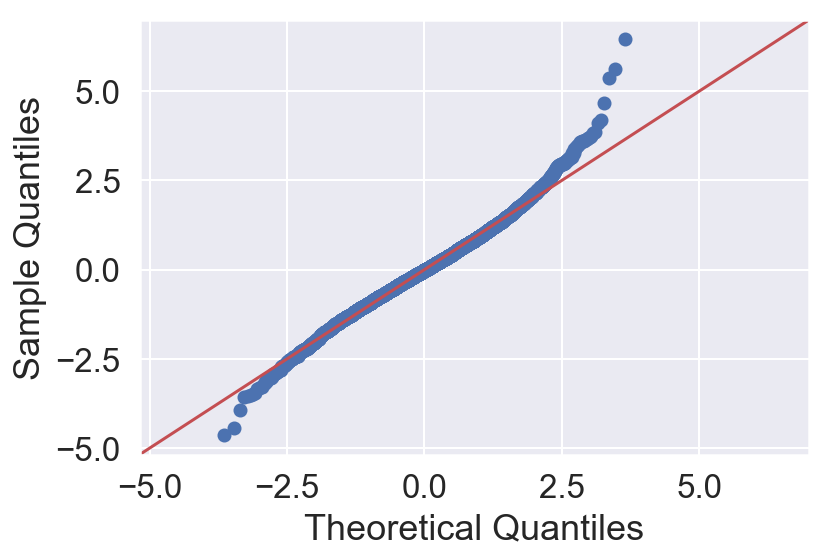

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3478      1.5264
MAE      1.9830     1.8656       1.1757      0.9626
R^2      0.0000    -0.5708       0.6219      0.5082


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(1, 0, 2, 24)   Log Likelihood              -13691.755

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6064      0.022     72.631      0.000       1.563       1.650
ar.L2         -0.6163      0.020    -30.795      0.000      -0.656      -0.577
ma.L1         -1.0657      0.023    -46.385      0.000      -1.111      -1.021
ma.L2          0.1251      0.015      8.302      0.000       0.096       0.155
ar.S.L24       0.9994      0.000   3881.024      0.000       0.999       1.000
ma.S.L24     

QUANTILE PLOT - ALL RESIDUALS


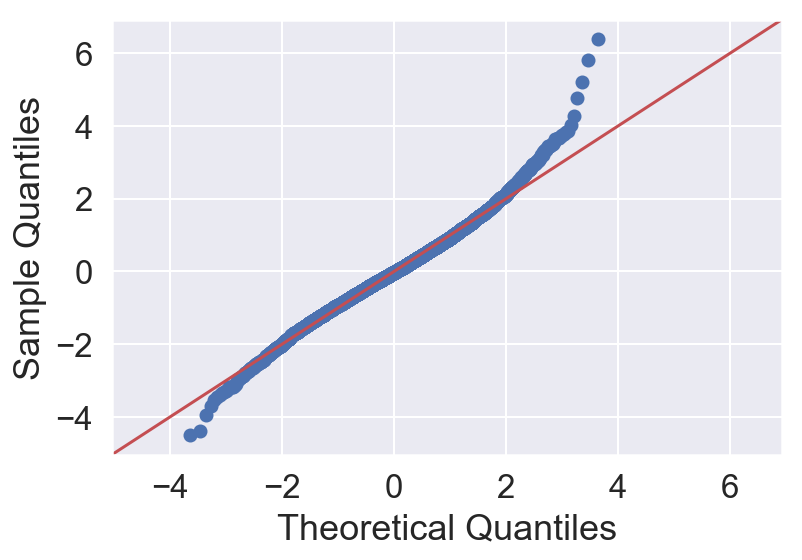

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3354      1.5027
MAE      1.9830     1.8656       1.1737      0.9531
R^2      0.0000    -0.5708       0.6239      0.5158


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(2, 0, 1, 24)   Log Likelihood              -13671.339

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.5759      0.022     71.824      0.000       1.533       1.619
ar.L2         -0.5861      0.020    -29.347      0.000      -0.625      -0.547
ma.L1         -1.0536      0.022    -48.261      0.000      -1.096      -1.011
ma.L2          0.1130      0.014      7.798      0.000       0.085       0.141
ar.S.L24       1.0664      0.009    122.348      0.000       1.049       1.084
ar.S.L48     

QUANTILE PLOT - ALL RESIDUALS


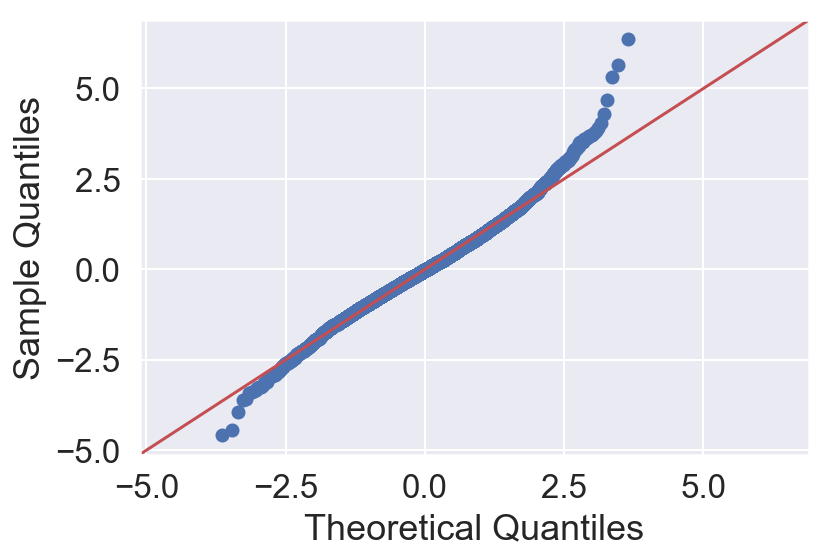

     Base_train  Base_test  Model_train  Model_test
MSE      6.2101     4.8749       2.3589      1.5244
MAE      1.9830     1.8656       1.1790      0.9614
R^2      0.0000    -0.5708       0.6201      0.5088


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 7565
Model:             SARIMAX(2, 0, 2)x(2, 0, 2, 24)   Log Likelihood              -13710.050

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4586      0.059     24.899      0.000       1.344       1.573
ar.L2         -0.4941      0.049    -10.001      0.000      -0.591      -0.397
ma.L1         -0.9208      0.061    -15.197      0.000      -1.040      -0.802
ma.L2          0.0777      0.027      2.884      0.004       0.025       0.130
ar.S.L24       0.0570      0.014      4.051      0.000       0.029       0.085
ar.S.L48     

QUANTILE PLOT - ALL RESIDUALS


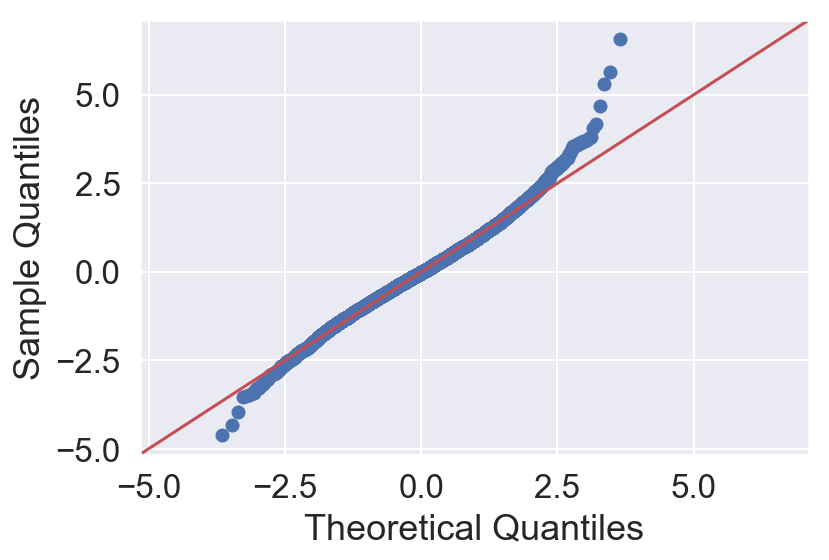

In [10]:
season=24
frequency='H'
lag=[1,2]
ma=[1,2]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(data,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILD')


     Base_train  Base_test  Model_train  Model_test
MSE      5.4280     4.4041       2.1320      1.3502
MAE      1.8691     1.7895       1.1092      0.9075
R^2      0.0000    -0.6747       0.6072      0.4866


STATESPACE MODEL RESULTS AND DIAGNOSTICS
Dep. Variable:                        pros_online   No. Observations:                 3783
Model:             SARIMAX(1, 0, 1)x(1, 0, 1, 12)   Log Likelihood               -6659.748

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6525      0.019     34.789      0.000       0.616       0.689
ma.L1         -0.0735      0.024     -3.092      0.002      -0.120      -0.027
ar.S.L12       0.9993      0.000   3057.667      0.000       0.999       1.000
ma.S.L12      -0.9533      0.005   -192.671      0.000      -0.963      -0.944
sigma2         2.1069      0.040     52.940      0.000       2.029       2.185



QUANTILE PLOT - ALL RESIDUALS


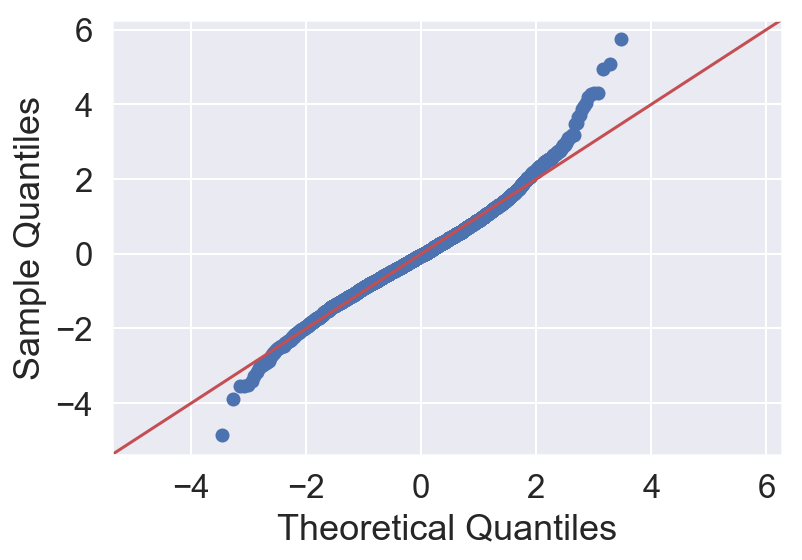

In [13]:
season=12
frequency='2H'
lag=[1]
ma=[1]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(data,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILD')


In [14]:
model_test(data,2,1,2,1,12,'2H')

ValueError: Non-stationary starting autoregressive parameters found with `enforce_stationarity` set to True.

In [ ]:
# season=168
# frequency='H'
# lag=[1,2]
# ma=[1,2]

# for i in lag:
#     for j in ma:
#         for k in lag:
#             for l in ma:
#                 try:
#                     model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
#                 except:
#                     print(i,j,k,l,'PARAMETERS FAILED')

1 1 1 1 PARAMETERS FAILED
1 1 1 2 PARAMETERS FAILED
1 1 2 1 PARAMETERS FAILED


In [15]:
season=12
frequency='2H'
lag=[1,2]
ma=[1,2]

for i in [2]:
    for j in [1]:
        for k in [2]:
            for l in [1]:
                try:
                    model_test(data,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILED')

2 1 2 1 PARAMETERS FAILED


In [ ]:
# season=84
# frequency='2H'
# lag=[1,2]
# ma=[1,2]

# for i in lag:
#     for j in ma:
#         for k in lag:
#             for l in ma:
#                 try:
#                     model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
#                 except:
#                     print(i,j,k,l,'PARAMETERS FAILED')

In [ ]:
season=6
frequency='4H'
lag=[1,2]
ma=[1,2]

for i in lag:
    for j in ma:
        for k in lag:
            for l in ma:
                try:
                    model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
                except:
                    print(i,j,k,l,'PARAMETERS FAILED')

In [ ]:
# season=42
# frequency='4H'
# lag=[1,2]
# ma=[1,2]

# for i in lag:
#     for j in ma:
#         for k in lag:
#             for l in ma:
#                 try:
#                     model_test(rec_traffic.rec_games_count,i,j,k,l,season,frequency)
#                 except:
#                     print(i,j,k,l,'PARAMETERS FAILED')